<a href="https://colab.research.google.com/github/TXH2020/MainRepo/blob/main/Academics/Image%20Processing/Image_Processing1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import os
import urllib.request as ureq
def file_exists(s,url='https://raw.githubusercontent.com/PacktPublishing/Hands-On-Image-Processing-with-Python/master/images/'):
  if(not(os.path.isfile(s))):
    ureq.urlretrieve(url+s,s)

In [2]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
def show_image(file):
  plt.figure(figsize=(10,10)),plt.imshow(file),plt.axis('off'),plt.show()

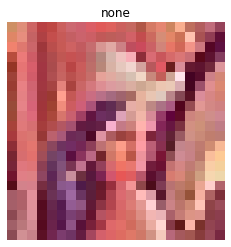

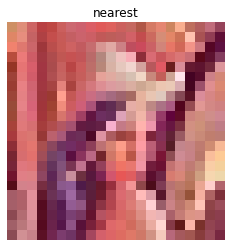

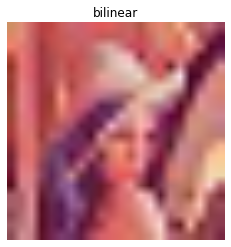

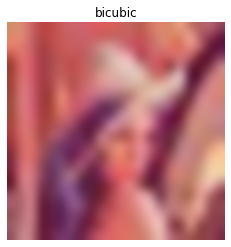

In [3]:
#Different interpolation methods

file_exists('lena_small.jpg')
im=mpimg.imread('lena_small.jpg')
methods=['none','nearest','bilinear','bicubic']
for i in methods:
  plt.imshow(im,interpolation=i),plt.axis('off'),plt.title(i)
  plt.show()

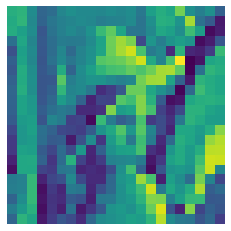

(<matplotlib.image.AxesImage at 0x7fe42e913d10>,
 (-0.5, 21.5, 21.5, -0.5),
 None)

In [4]:
#Converting rgb to grayscale
import skimage.io as sk
im=sk.imread('lena_small.jpg',as_gray=True)  #Or use color.rgb2gray (from skimage import color)
plt.imshow(im),plt.axis('off'),plt.show()

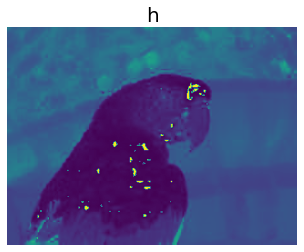

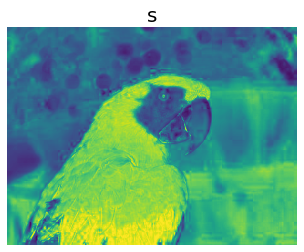

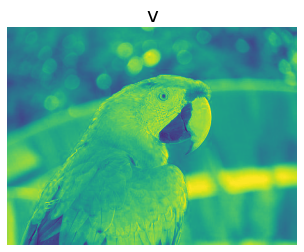

(<matplotlib.image.AxesImage at 0x7fe42d756c10>,
 Text(0.5, 1.0, 'v'),
 (-0.5, 452.5, 339.5, -0.5),
 None)

In [5]:
#Converting RGB to HSV color space
from skimage import color
file_exists('parrot.png')
im = sk.imread("parrot.png")
im_hsv =color.rgb2hsv(im)
plt.imshow(im_hsv[...,0]), plt.title('h', size=20),plt.axis('off'),plt.show()
plt.imshow(im_hsv[...,1]),plt.title('s', size=20), plt.axis('off'),plt.show()
plt.imshow(im_hsv[...,2]), plt.title('v', size=20),plt.axis('off'),plt.show()

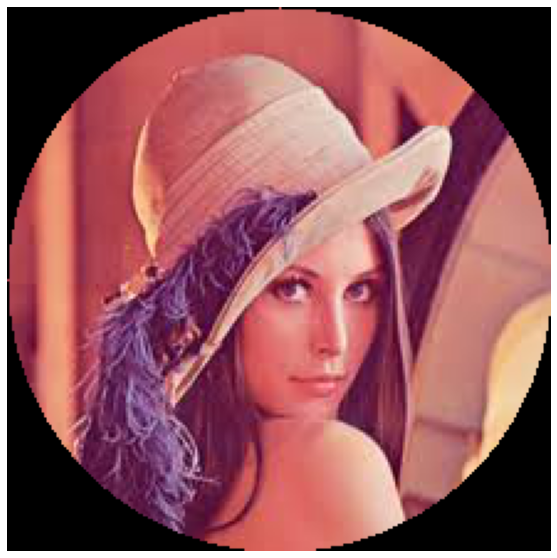

In [6]:
#masking image
import numpy as np
file_exists('lena.jpg')
im=mpimg.imread('lena.jpg').copy()
lx,ly,_=im.shape
X, Y = np.ogrid[0:lx, 0:ly]
mask=(X-lx/2)**2+(Y-ly/2)**2>lx*ly/4
im[mask,:]=0
show_image(im)
#To slice image just use array: Eg, im[10:13, 20:23,0:1]

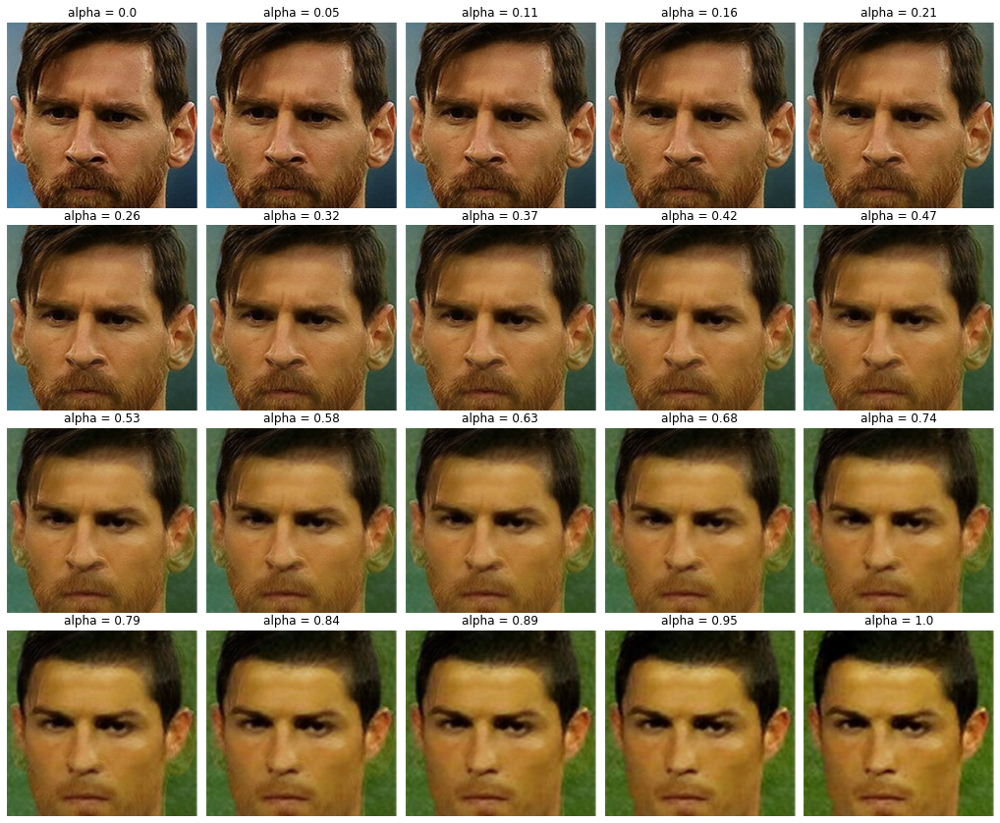

In [7]:
#Image Morphing
file_exists('messi.jpg')
file_exists('ronaldo.jpg')
im1 = mpimg.imread("messi.jpg") / 255 # scale RGB values in [0,1]
im2 = mpimg.imread("ronaldo.jpg") / 255
i=1
plt.figure(figsize=(18,15))
for alpha in np.linspace(0,1,20):
    ax = plt.subplot(4,5,i)
    plt.imshow((1-alpha)*im1 + alpha*im2)
    ax.title.set_text('alpha = '+ str(round(alpha,2)))
    plt.axis('off')
    i += 1
plt.subplots_adjust(wspace=0.05, hspace=0.05)
plt.show()

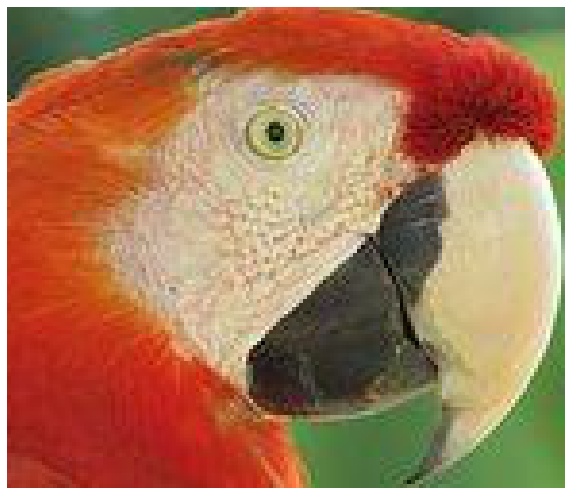

In [8]:
#Cropping image
from PIL import Image
im=Image.open('parrot.png')
im_cropped=im.crop((175,75,320,200))
show_image(im_cropped)

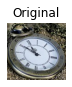

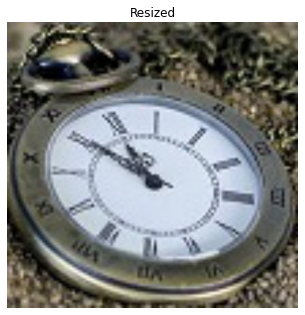

(<Figure size 385.2x378 with 1 Axes>,
 (-0.5, 534.5, 524.5, -0.5),
 Text(0.5, 1.0, 'Resized'),
 None)

In [9]:
#Resizing Image(Upsampling)
file_exists('clock.jpg')
im = Image.open("clock.jpg")
pix = np.array(im)
dpi = 100
height, width, depth = pix.shape
figsize = width / float(dpi), height / float(dpi)
plt.figure(figsize=figsize),plt.imshow(im),plt.axis('off'),plt.title('Original'),plt.show()
im_large = im.resize((width*5, height*5), Image.BILINEAR)
#im_large = im.resize(width*5, height*5, Image.BILINEAR) # bi-linear interpolation
pix1 = np.array(im_large)
dpi = 100
height, width, depth = pix1.shape
figsize = width / float(dpi), height / float(dpi)
plt.figure(figsize=figsize),plt.imshow(im_large),plt.axis('off'),plt.title('Resized'),plt.show()

(-0.5, 452.5, 339.5, -0.5)

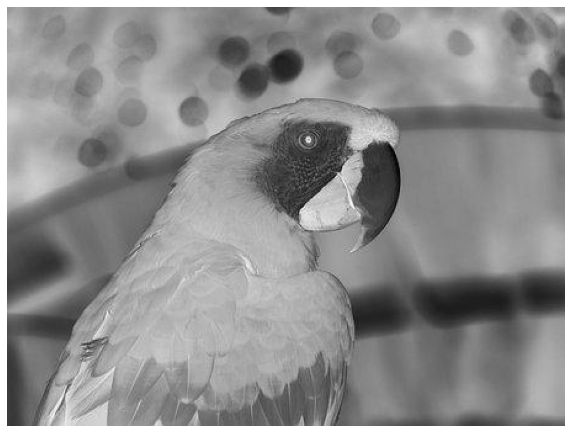

In [10]:
#negating image
im = Image.open("parrot.png")
im_g = im.convert('L')
im_t = im_g.point(lambda x: 255 - x)
plt.figure(figsize=(10,10))
plt.imshow(im_t, cmap = 'gray')
plt.axis('off')

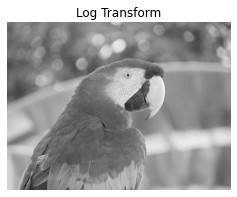

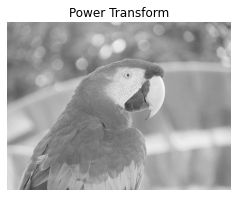

(<Figure size 288x288 with 1 Axes>,
 Text(0.5, 1.0, 'Power Transform'),
 (-0.5, 452.5, 339.5, -0.5),
 None)

In [11]:
#Log Transformation,Power Transformation
im_l = im_g.point(lambda x: 255*np.log(1+x/255))
plt.figure(figsize=(4,4)),plt.imshow(im_l, cmap = 'gray'),plt.title('Log Transform'),plt.axis('off'),plt.show()
im_2=im_g.point(lambda x: 255*(x/255)**0.6)
plt.figure(figsize=(4,4)),plt.imshow(im_2, cmap = 'gray'),plt.title('Power Transform'),plt.axis('off'),plt.show()

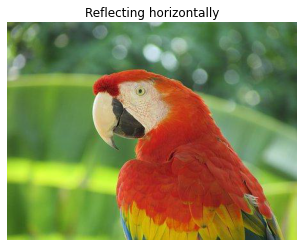

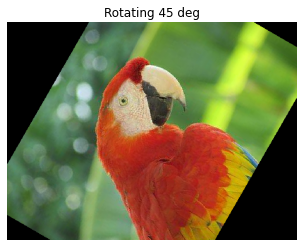

(<matplotlib.image.AxesImage at 0x7fe42d0a5690>,
 Text(0.5, 1.0, 'Rotating 45 deg'),
 (-0.5, 452.5, 339.5, -0.5),
 None)

In [12]:
#Reflecting image,Rotating Image
im_re=im.transpose(Image.FLIP_LEFT_RIGHT)
plt.imshow(im_re),plt.title('Reflecting horizontally'),plt.axis('off'),plt.show()
im_ro=im.rotate(60)
plt.imshow(im_ro),plt.title('Rotating 45 deg'),plt.axis('off'),plt.show()

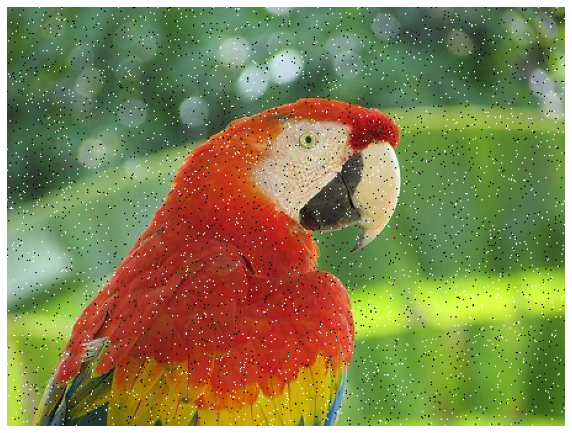

In [13]:
#Adding salt and pepper noise
im_c = im.copy() # keep the original image, create a copy
n = 5000
x, y = np.random.randint(0, im.width, n), np.random.randint(0,im.height, n)
for (x,y) in zip(x,y):
 im_c.putpixel((x, y), ((0,0,0) if np.random.rand() < 0.5 else(255,255,255))) # salt-and-pepper noise
show_image(im_c)

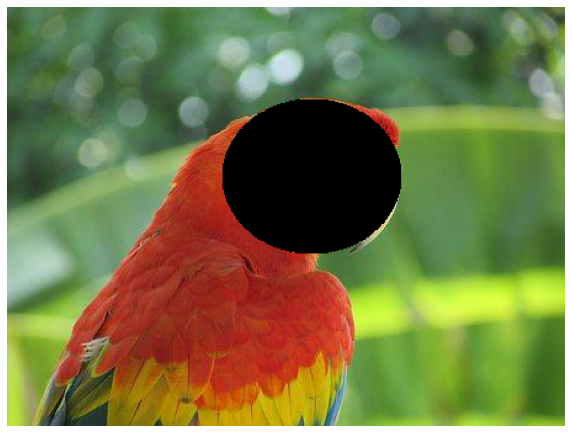

In [14]:
#Drawing on an image
from PIL import ImageDraw
im_c1=im.copy()
draw=ImageDraw.Draw(im_c1)
draw.ellipse((175,75,320,200),fill=(0,0,0))
del draw
show_image(im_c1)

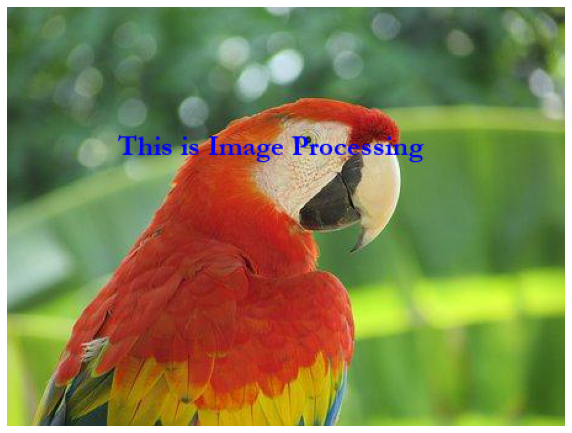

In [15]:
#Writing on Image
file_exists('Garamond.ttf','https://raw.githubusercontent.com/TXH2020/MainRepo/main/Academics/Image%20Processing/garamond/')
from PIL import ImageFont
im_c2=im.copy()
draw = ImageDraw.Draw(im_c2)
font = ImageFont.truetype("Garamond.ttf", 23) 
draw.text((90,100),text="This is Image Processing", font = font, fill=(0,0,255))
del draw
show_image(im_c2)

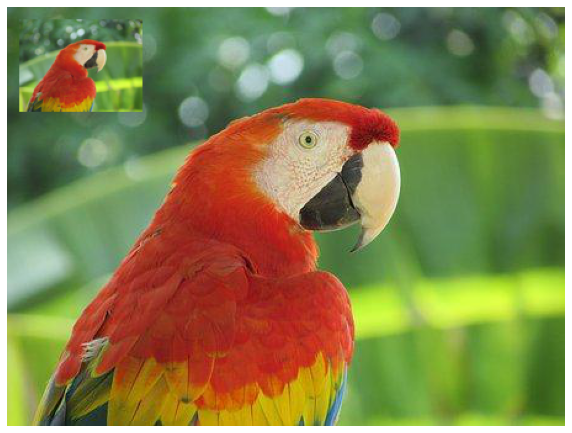

In [16]:
#Image Thumbnail
im_c3=im.copy()
im_thumbnail = im.copy() # need to copy the original image first
im_thumbnail.thumbnail((100,100)) # now paste the thumbnail on the image
im_c3.paste(im_thumbnail, (10,10))
show_image(im_c3)

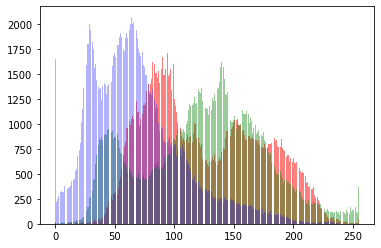

In [17]:
#Plotting the histograms of pixel values for the RGB channels of an image
pl = im.histogram()
plt.bar(range(256), pl[:256], color='r', alpha=0.5)
plt.bar(range(256), pl[256:2*256], color='g', alpha=0.4)
plt.bar(range(256), pl[2*256:], color='b', alpha=0.3)
plt.show()

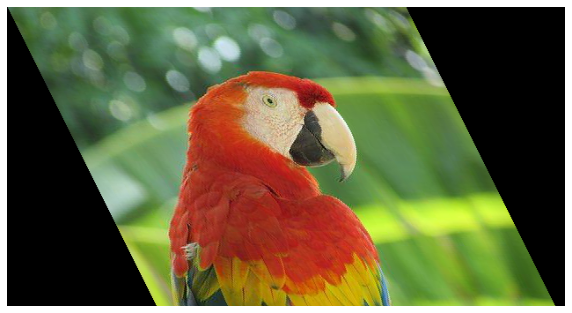

In [18]:
#Aplying Shear Affine Transform
im_a = im.transform((int(1.4*im.width), im.height), Image.AFFINE,data=(1,-0.5,0,0,1,0)) # shear
show_image(im_a)

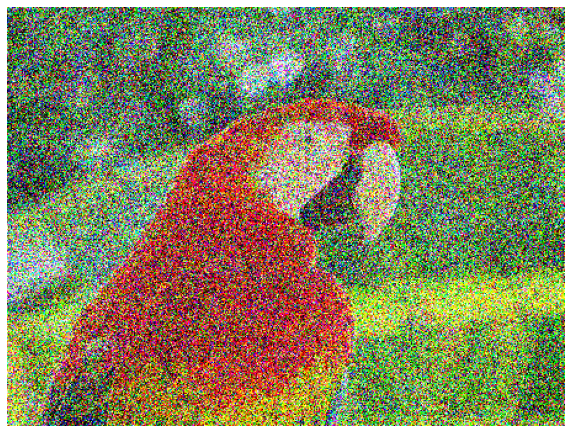

In [19]:
#Adding random gaussian noise
from skimage.util import random_noise
from skimage import img_as_float
sigma=0.45
noisy = random_noise(img_as_float(im), var=sigma**2)
show_image(noisy)

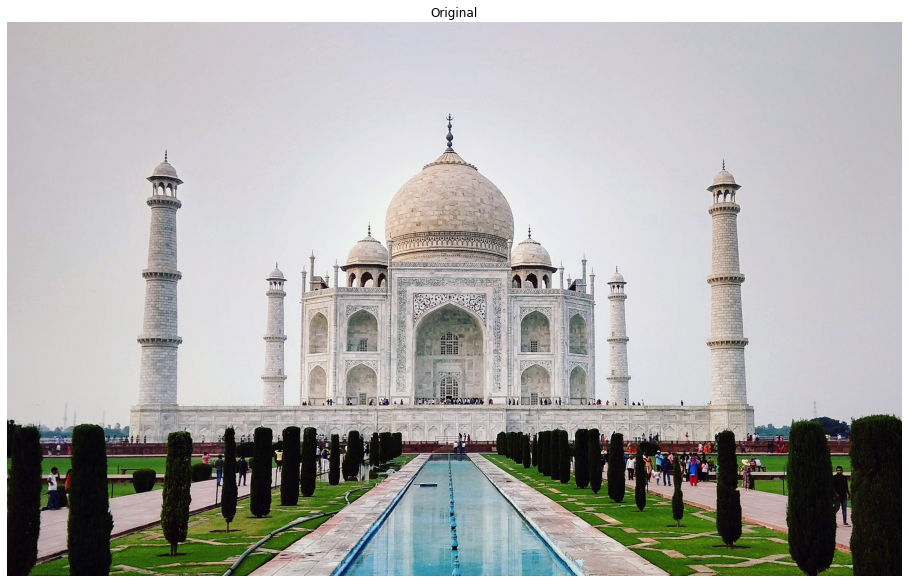

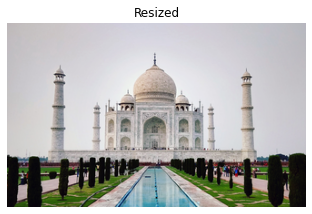

(<Figure size 385.2x378 with 1 Axes>,
 (-0.5, 328.5, 202.5, -0.5),
 Text(0.5, 1.0, 'Resized'),
 None)

In [20]:
#Resize(Downsampling)
file_exists('tajmahal.jpg')
im = Image.open("tajmahal.jpg")
pix = np.array(im)
dpi = 100
height, width, depth = pix.shape
figsize = width / float(dpi), height / float(dpi)
plt.figure(figsize=figsize),plt.imshow(im),plt.axis('off'),plt.title('Original'),plt.show()
im_small = im.resize((im.width//5, im.height//5), Image.ANTIALIAS)
pix1 = np.array(im_large)
dpi = 100
height, width, depth = pix1.shape
figsize = width / float(dpi), height / float(dpi)
plt.figure(figsize=figsize),plt.imshow(im_small),plt.axis('off'),plt.title('Resized'),plt.show()

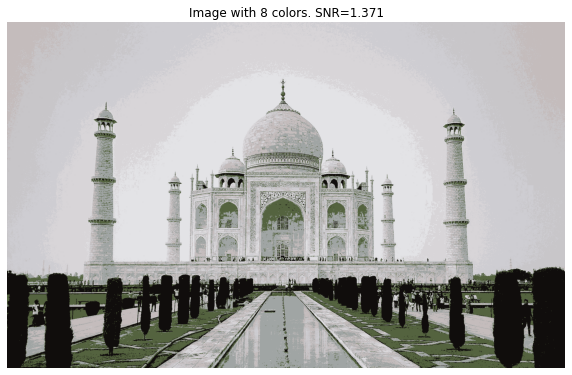

(<matplotlib.image.AxesImage at 0x7fe42bd4cbd0>,
 (-0.5, 1644.5, 1017.5, -0.5),
 None)

In [21]:
#Quantization
def signaltonoise(a, axis=0, ddof=0):
    a = np.asanyarray(a)
    m = a.mean(axis)
    sd = a.std(axis=axis, ddof=ddof)
    return np.where(sd == 0, 0, m/sd)
snr=0
im1 = im.convert('P', palette=Image.ADAPTIVE, colors=8)
snr=signaltonoise(im1, axis=None)
plt.figure(figsize=(10,10))
plt.title("Image with 8 colors. SNR="+str(np.round(snr,3)))
plt.imshow(im1),plt.axis('off'),plt.show()

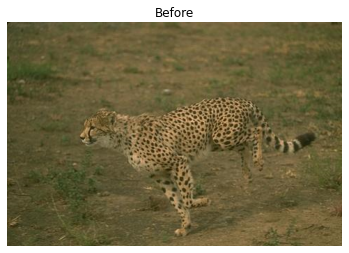

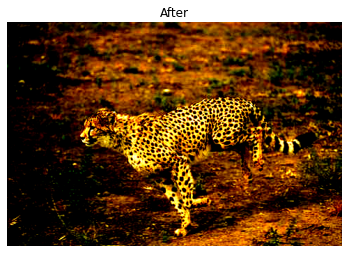

(<matplotlib.image.AxesImage at 0x7fe42bc8b910>,
 (-0.5, 480.5, 320.5, -0.5),
 None)

In [22]:
#Contrast Streching
def contrast(c):
    return 0 if c < 70 else (255 if c > 150 else (255*c - 22950) / 48)
file_exists('cheetah.png')
im=Image.open('cheetah.png')
plt.figure(figsize=(6,6)),plt.title('Before')
plt.imshow(im),plt.axis('off'),plt.show()
im1 = im.point(contrast)
plt.figure(figsize=(6,6)),plt.title('After')
plt.imshow(im1),plt.axis('off'),plt.show()

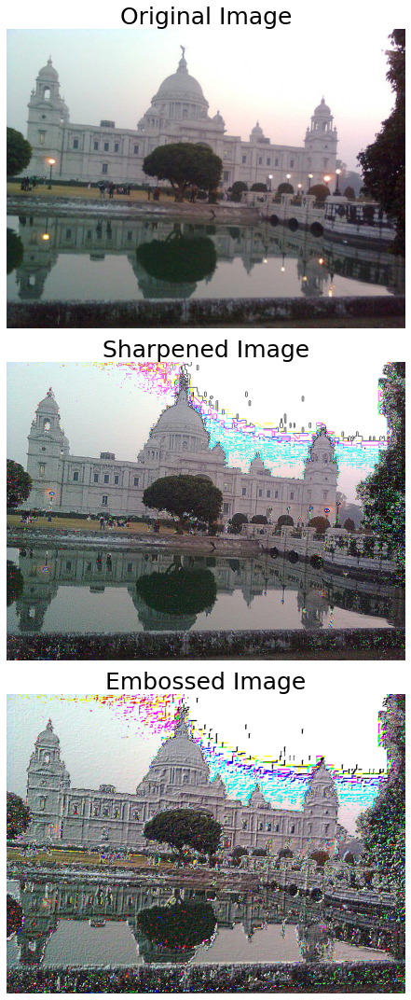

In [23]:
#Image sharpening and embossing
from scipy import ndimage
file_exists('victoria_memorial.png')
im=sk.imread('victoria_memorial.png')
sharpen_kernel = np.array([0, -1, 0, -1, 5, -1, 0, -1, 0]).reshape((3, 3, 1))
emboss_kernel = np.array(np.array([[-2,-1,0],[-1,1,1],[0,1,2]])).reshape((3, 3, 1))
im_sharp = ndimage.convolve(im, sharpen_kernel, mode='nearest')
im_sharp = np.clip(im_sharp, 0, 255).astype(np.uint8) # clip (0 to 255) and convert to unsigned int
im_emboss = ndimage.convolve(im, emboss_kernel, mode='nearest')
im_emboss = np.clip(im_emboss, 0, 255).astype(np.uint8)
plt.figure(figsize=(10,15))
plt.subplot(311),plt.imshow(im.astype(np.uint8)), plt.axis('off')
plt.title('Original Image', size=25)
plt.subplot(312), plt.imshow(im_sharp), plt.axis('off')
plt.title('Sharpened Image', size=25)
plt.subplot(313), plt.imshow(im_emboss), plt.axis('off')
plt.title('Embossed Image', size=25)
plt.tight_layout()
plt.show()

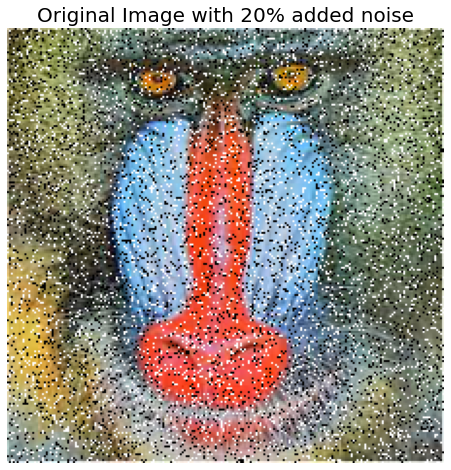

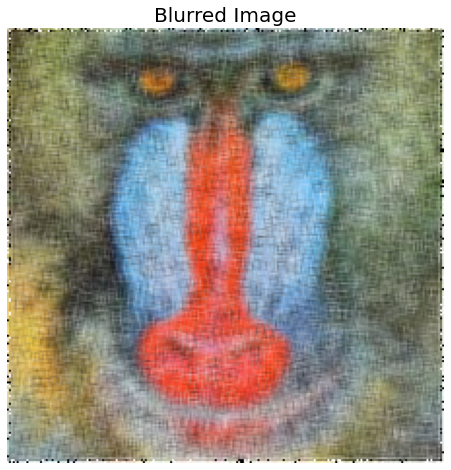

In [24]:
#Image Smoothening
from PIL import ImageFilter
file_exists('mandrill.jpg')
im = Image.open('mandrill.jpg')
    # choose 5000 random locations inside image
def plot_image(image, title=''):
    plt.title(title, size=20), plt.imshow(image)
    plt.axis('off')
n = int(im.width * im.height * 0.2)
x, y = np.random.randint(0, im.width, n), np.random.randint(0, im.height, n)
for (x,y) in zip(x,y):
        im.putpixel((x, y), ((0,0,0) if np.random.rand() < 0.5 else (255,255,255))) # generate salt-and-pepper noise
im.save('mandrill_spnoise_' + str(0.2) + '.jpg')
plt.figure(figsize=(8,8)), plot_image(im, 'Original Image with ' +str(int(100*0.2)) + '% added noise')   
im1 = im.filter(ImageFilter.BLUR)
plt.figure(figsize=(8,8)), plot_image(im1, 'Blurred Image')  
plt.show()

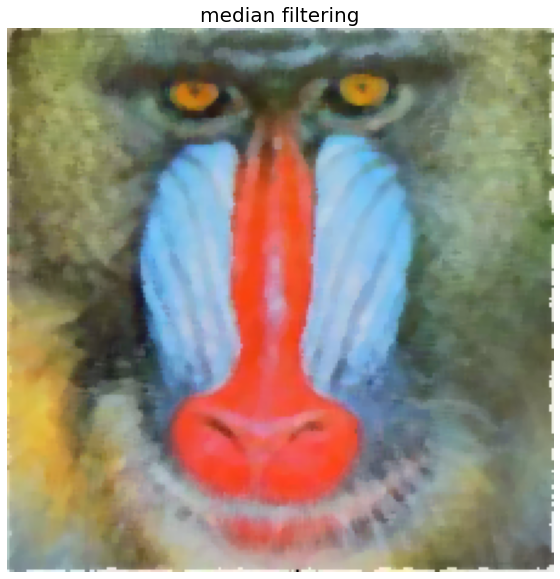

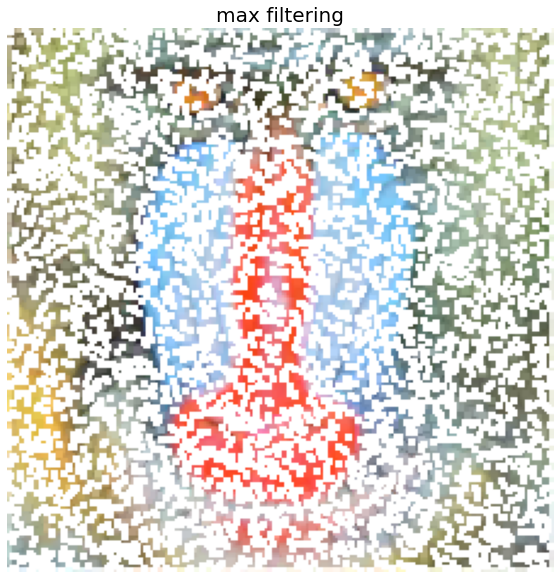

(<Figure size 720x720 with 1 Axes>, None, None)

In [25]:
#Median and max filtering
im2=im.filter(ImageFilter.MedianFilter(size=5))
plt.figure(figsize=(10,10)),plot_image(im2,'median filtering'),plt.show()
im3 = im.filter(ImageFilter.MaxFilter(size=3))
plt.figure(figsize=(10,10)),plot_image(im3,'max filtering'),plt.show()

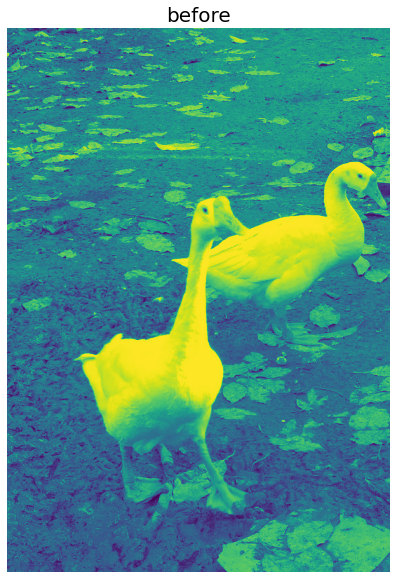

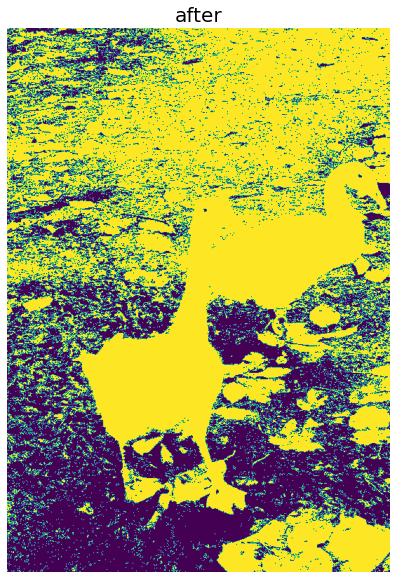

(<Figure size 720x720 with 1 Axes>, None, None)

In [26]:
#laplacian filtering
file_exists('swans.jpg')
im=Image.open('swans.jpg').convert('L')
plt.figure(figsize=(10,10)),plot_image(im,'before'),plt.show()
im_1 =  im.point(lambda x: x > 100)
plt.figure(figsize=(10,10)),plot_image(im_1,'after'),plt.show()

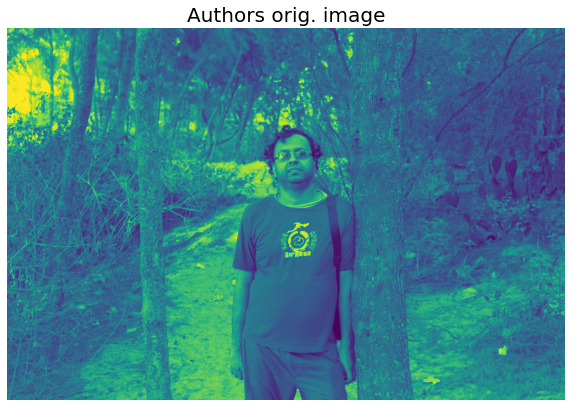

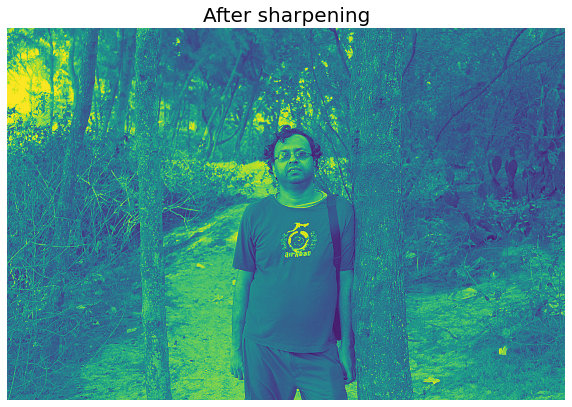

(<Figure size 720x720 with 1 Axes>, None, None)

In [27]:
from skimage.color import rgb2gray
from skimage.filters import laplace
file_exists('me8.JPG')
im=rgb2gray(sk.imread('me8.JPG'))
plt.figure(figsize=(10,10)),plot_image(im,'Authors orig. image'),plt.show()
im1 = np.clip(laplace(im) + im, 0, 1)
plt.figure(figsize=(10,10)),plot_image(im1,'After sharpening'),plt.show()